In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch import optim
from accelerate import Accelerator #to use pytorch
from torch.utils.data import DataLoader
from encoder import SpectrumEncoder,MLP,encoder_percentiles,load_model
import sys
from scipy import  integrate
from scipy import interpolate
import os
from astropy.io import fits
from tqdm import tqdm,trange
import dense_basis as db
from scipy.optimize import curve_fit
from matplotlib import gridspec
import matplotlib as mpl
import pickle
from generate_input import *

mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['xtick.labelsize'] = 'medium'
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.labelsize'] = 'medium'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['legend.frameon'] = True
mpl.rcParams['font.size'] = 30
mpl.rcParams["figure.figsize"] = (15,10)
mpl.rcParams["mathtext.fontset"]='dejavuserif'

Starting dense_basis. Failed to load FSPS, only GP-SFH module will be available.
running without emcee


## Define simulator

Big difference, for the SBC test we are only promediating 9 simple stellar populations, all weigthed equally, intead of taking into account 1.000 datapoints of the full SFH as in the inference part. This is because we need to simulate quantities only taking into account the posteriors (i.e. the quantities) predicted.

In [3]:


def simulator(predictions):
    """Spectra generated as a linear combination of MILES SSP spectra with the weights coming from the non-cumulative mass curve derived from the percentile predictions of the model and metallicity fixed by the predictions.

    Parameters
    ----------
    predictions: array of size (number of observations = len(predictions[:,0]), number of features predicted = 10)
            Values predicted for the percentiles and metallicity
        
    Returns
    -------
    seds_from_percent: list of arrays
            Arrays containing the normalized flux of the linear combinations for each observation
    """
    if len(np.shape(predictions))==1:
        predictions=np.reshape(predictions,(1,10))
    z=predictions[:,-1] #metallicities predicted by the model

    #load MILES spectra with these metallicities
    dir1='../MILES/MILES_BASTI_KU_baseFe'
    tbins=get_tbins(dir_name=dir1,strs_1='Mku1.30Zp0.06T',strs_2='_iTp0.00_baseFe.fits')
    wave,data_met=get_data_met(dir_name=dir1[:-7],z=z)
    data=[]
    for i in range(len(predictions[:,0])):
        data.append(data_met[:,:,i])


    #Get the weights and perform the linear combination interpolating previously 

    seds_from_percent=[]

    print('All loaded, generating...')
    
    for i in trange(len(predictions[:,0])):
        
        #notice we need to interpolate using lookback time (MILES)
        data_extended=interpolate_t(tbins,14-predictions[i,:9],data[i])
        spectrum=[]
        
        for l in range(9):  #we append older first
            spectrum.append(((1/9)*data_extended[-l]))
            
        spectrum=np.array(spectrum)
        sed_from_percent=np.sum(spectrum,axis=0) #we add the terms of the linear combination
        seds_from_percent.append(sed_from_percent/np.median(sed_from_percent))
    return seds_from_percent

# Load physical parameters and obtain spectra with the simulator  

Intead of with the full SFH as done during the inference. We can compare the spectra obtained with the two different methods.

In [ ]:
y=np.load('./saved_input/y.npy')
seds_main=np.load('../seds.npy')
print(len(y))
seds_sbc=simulator(y[:100])

In [24]:
print(len(seds_main[0]))
print(len(seds_sbc[0]))

4300
4300


In [ ]:
#compare spectra
w=np.load('./saved_input/wave.npy')
for i in range(10):
    print(y[i])
    plt.plot(w,seds_main[i],'g',label='From full SFH')
    plt.plot(w,seds_sbc[i],'r',label='From percentiles')
    plt.show()


## Without  retraining

We assume the spectra are very similar so we do not need to retrain either the Encoder or the  Normalizing Flow


In [27]:
class Dataset(torch.utils.data.Dataset):

    def __init__(self,x):

        """ generate and organize data for training and testing"""

        self.x=torch.from_numpy(x) #seds
        

    def __len__(self):
        """total number of samples"""
        return len(self.x[:,0])

    def __getitem__(self,index):
        """Generates one sample of data"""
        x=self.x[index,:]
        return x
    
def get_latents(seds):
    #create a pytorch dataset
    dataset = Dataset(np.array(seds) )
    params={'batch_size': 1 } 
    generator = torch.utils.data.DataLoader(dataset,**params) #without minibatches

    #call accelerator
    accelerator = Accelerator(mixed_precision='fp16')
    loader = accelerator.prepare(generator)

    #load model
    n_latent=16
    model_file = "./saved_models/checkpoint.pt"
    model, loss = load_model(model_file, device=accelerator.device,n_hidden=(16,32),n_out=10)
    model = accelerator.prepare(model)
            
    #predict
    ss=[]
    ys_=[]
    print('Getting latent vectors and predicted percentiles')
    with torch.no_grad():
        model.eval()
        for  batch in tqdm(loader):
                    s,y_ = model._forward(batch.float())
                    ss.append(s.cpu().numpy())
                    ys_.append(y_.cpu().numpy())

    ss=np.array(ss)[:,0,:]
    return ss
    
#create a pytorch dataset
def predictor(seds,nsim=100,file="./saved_models/my_posterior.pkl"):
    
    ss=get_latents(seds)

    file = open(file, 'rb')
    qphi = pickle.load(file)
    file.close()


    posteriors=[]

    for i in trange(len(seds)):
        posteriors.append(np.array(qphi.sample((nsim,), 
                                        x=torch.as_tensor(ss[i,:]).to('cpu'), 
                                        show_progress_bars=False).detach().to('cpu')))

    return ss,posteriors

## Posterior predictive checks

In [83]:
nsim=100

x=np.random.randint(150000)
print(x)

#forward model
#obtain a simulated observation from physical properties
sed_sbc_i=simulator(y[x,:])
#latents_sbc_i=get_latents(sed_sbc_i)



#backward model
#use your trained model to obtain from that simulated observation a posterior for the physical properties
latent_vector,posterior_samples=predictor(sed_sbc_i,nsim=nsim)


#print(latents_sbc_i,latent_vector) they are exactly the same


##rerun forward model and compare observations (in the latent space to avoid dealing with 4300 channels to compare)

samples=np.reshape(posterior_samples[0][:],(nsim,10))
posterior_predictive_samples=get_latents(simulator(samples))

92423
Getting latent vectors and predicted percentiles


100%|██████████| 1/1 [00:00<00:00, 22.34it/s]


Getting latent vectors and predicted percentiles


100%|██████████| 100/100 [00:01<00:00, 98.96it/s]


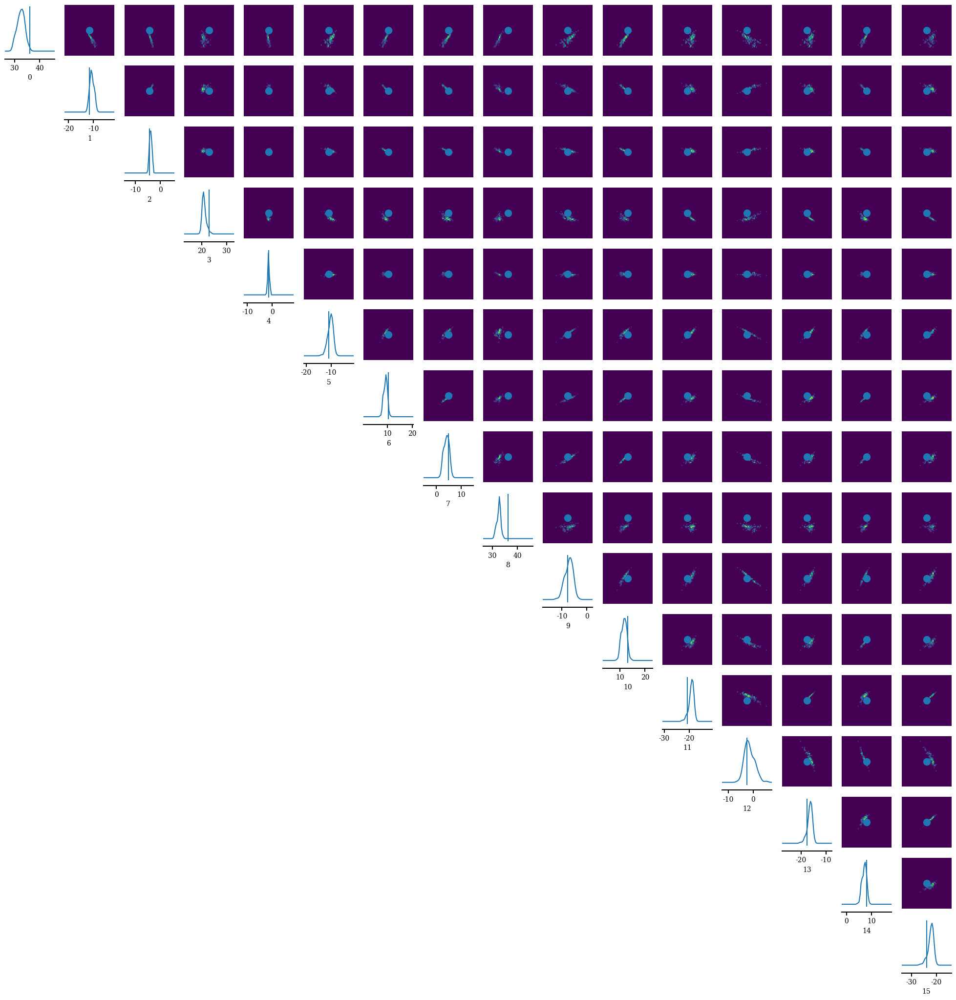

In [84]:
# let's do some posterior predictive checks to see if the
# posterior predictive samples cluster aournd the observation in the latent space

from sbi.analysis import check_sbc, run_sbc, get_nltp, sbc_rank_plot,pairplot
mpl.rcParams['font.size'] = 10
fig, ax = pairplot(
    samples=np.array(posterior_predictive_samples)[:,:],
    points=latent_vector[:],
    limits=list(zip(latent_vector.flatten() - 10.0, latent_vector.flatten() + 10.0)),
    offdiag="kde",
    diag="kde",
    figsize=(25, 25),
    labels=[rf"{d}" for d in range(16)]
)



## SBC

In [ ]:
num_sbc_runs = 1000  # choose a number of sbc runs, should be ~100s or ideally 1000
# generate ground truth parameters and corresponding simulated observations for SBC.

thetas=np.zeros((num_sbc_runs,10))
xs=np.zeros((num_sbc_runs,16))

for i in trange(num_sbc_runs):
    x=np.random.randint(150000)
    print(x)
    thetas[i,:]=y[x,:]
    xs[i,:]=get_latents(simulator(thetas[i,:]))

In [86]:
num_posterior_samples = 1000
file="./saved_models/my_posterior.pkl"
file = open(file, 'rb')
qphi = pickle.load(file)
file.close()


ranks, dap_samples = run_sbc(
    torch.as_tensor(np.array(thetas).astype(np.float32)).to('cpu'), torch.as_tensor(np.array(xs).astype(np.float32)).to('cpu'), qphi, num_posterior_samples=num_posterior_samples)

Running 1000 sbc samples.: 100%|██████████| 1000/1000 [01:25<00:00, 11.76it/s]


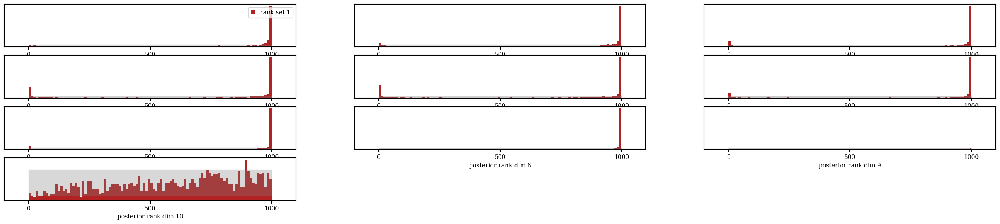

In [96]:
f, ax = sbc_rank_plot(
    ranks=ranks[:,:],
    num_posterior_samples=1000,
    plot_type="hist",
    num_bins=100,  # by passing None we use a heuristic for the number of bins.
    ranks_labels=None,
    figsize=(30,6),kwargs={'line_alpha':1,'num_cols':3})

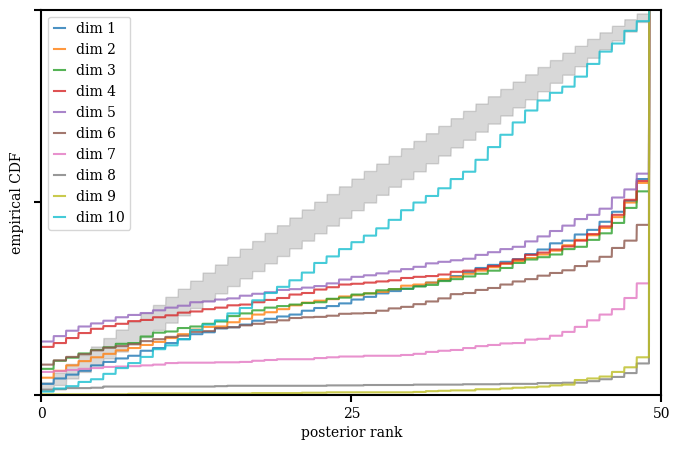

In [90]:
f, ax = sbc_rank_plot(ranks, 1_000, plot_type="cdf")

We see some problems, what if we repeat the training of the normalizing flow with the new simulation taking only into account 9 ssp. We redefine the simulator function to agrupe in bins of metallicity.

In [19]:
def simulator_binning_met(predictions):
    """Spectra generated as a linear combination of MILES SSP spectra with the weights coming from the non-cumulative mass curve derived from the percentile predictions of the model and metallicity fixed by the predictions.

    Parameters
    ----------
    predictions: array of size (number of observations = len(predictions[:,0]), number of features predicted = 10)
            Values predicted for the percentiles and metallicity
        
    Returns
    -------
    seds_from_percent: list of arrays
            Arrays containing the normalized flux of the linear combinations for each observation
    """
    
    z=np.linspace(-2.3,0.4,15)

    seds_from_percent=[]


    #load MILES spectra with these metallicities
    dir1='../MILES/MILES_BASTI_KU_baseFe'
    tbins=get_tbins(dir_name=dir1,strs_1='Mku1.30Zp0.06T',strs_2='_iTp0.00_baseFe.fits')
    wave,data_met=get_data_met(dir_name=dir1[:-7],z=z)
    data=[]
    for i in range(len(z)):
        data.append(data_met[:,:,i])


    #Get the weights and perform the linear combination interpolating previously 

    print('All loaded, generating...')
    
    for i in trange(len(predictions[:,:])):
        k=np.where(z==predictions[i,-1])[0][0]
        #notice we need to interpolate using lookback time (MILES)
        data_extended=interpolate_t(tbins,14-predictions[i,:9],data[k])
        spectrum=[]
        
        for l in range(9):  #we append older first
            spectrum.append(((1/9)*data_extended[-l]))
            
        spectrum=np.array(spectrum)
        sed_from_percent=np.sum(spectrum,axis=0) #we add the terms of the linear combination
        seds_from_percent.append(sed_from_percent/np.median(sed_from_percent))
    return seds_from_percent



In [21]:
seds_newtrain=simulator_binning_met(y[:])
print(seds_newtrain)


All loaded, generating...


100%|██████████| 150000/150000 [1:03:02<00:00, 39.66it/s]  


[array([0.81060512, 0.80897736, 0.81496477, ..., 0.78461059, 0.77043495,
       0.7621355 ]), array([0.74528354, 0.74467766, 0.75048378, ..., 0.79043027, 0.77197693,
       0.757478  ]), array([0.79884891, 0.79757109, 0.80363933, ..., 0.7836288 , 0.76853318,
       0.7591372 ]), array([0.71284326, 0.71241584, 0.71836933, ..., 0.79614832, 0.77619308,
       0.75949302]), array([0.75697952, 0.7562376 , 0.76206723, ..., 0.7900101 , 0.77145715,
       0.75713371]), array([0.79286268, 0.79183418, 0.79767484, ..., 0.78378676, 0.76786475,
       0.75735325]), array([0.71609914, 0.7158454 , 0.72222345, ..., 0.79254837, 0.77332232,
       0.75693246]), array([0.81206846, 0.81093792, 0.81615349, ..., 0.78445157, 0.76840107,
       0.75798276]), array([0.67236527, 0.67241727, 0.67868141, ..., 0.80070442, 0.77981202,
       0.76132425]), array([0.7171128 , 0.71658575, 0.72248984, ..., 0.79796346, 0.77755494,
       0.76061578]), array([0.80282654, 0.80194176, 0.80739834, ..., 0.78326905, 0.7675676

In [22]:
latents_newtrain=get_latents(seds_newtrain)

np.save('seds_newtrain.npy',seds_newtrain)
np.save('latents_newtrain.npy',latents_newtrain)

Getting latent vectors and predicted percentiles


100%|██████████| 150000/150000 [22:20<00:00, 111.89it/s]


In [ ]:
latents_newtrain=get_latents(seds_newtrain)


In [7]:
#np.save('latents_newtrain.npy',latents_newtrain)

latents_newtrain=np.load('latents_newtrain.npy')

In [24]:
from sbi import utils as Ut
from sbi import inference as Inference

#shuffle for training

ind_sh=np.arange(len(latents_newtrain[:,0]))
np.random.shuffle(ind_sh)


#percentiles
lower_bounds = -0.1*torch.ones(np.shape(y[0,:]))
upper_bounds = 14.1*torch.ones(np.shape(y[0,:]))

#metallicity
lower_bounds[-1]=-2.4
upper_bounds[-1]=0.5

bounds = Ut.BoxUniform(low=lower_bounds, high=upper_bounds, device='cpu')

nhidden = 128 
nblocks = 5
maf_model = Ut.posterior_nn('maf', hidden_features=nhidden, num_transforms=nblocks)

anpe = Inference.SNPE(prior=bounds,
                      density_estimator=maf_model,
                      device='cpu')

#anpe, amortized neural posterior estimation
anpe.append_simulations(
            torch.as_tensor(y[ind_sh,:].astype(np.float32)).to('cpu'),
            torch.as_tensor(latents_newtrain[ind_sh,:].astype(np.float32)).to('cpu'))  

# estimate p(theta|X), the posterior
p_theta_x_est = anpe.train(learning_rate=5e-4)
qphi = anpe.build_posterior(p_theta_x_est)

 Neural network successfully converged after 137 epochs.

In [25]:
file="./saved_models/my_posterior_sbc.pkl"

with open(file, "wb") as handle:
    pickle.dump(qphi, handle)

handle.close()


In [4]:
file="./saved_models/my_posterior_sbc.pkl"


file = open(file, 'rb')
qphi = pickle.load(file)
file.close()

In [ ]:
from sbi.analysis import check_sbc, run_sbc, get_nltp, sbc_rank_plot,pairplot




num_sbc_runs = 10000  # choose a number of sbc runs, should be ~100s or ideally 1000
# generate ground truth parameters and corresponding simulated observations for SBC.
                        
num_posterior_samples = 1000

thetas=y[ind_sh,:][:num_sbc_runs,:]
xs=latents_newtrain[ind_sh,:][:num_sbc_runs,:]

ranks, dap_samples = run_sbc(
    torch.as_tensor(np.array(thetas).astype(np.float32)).to('cpu'), torch.as_tensor(np.array(xs).astype(np.float32)).to('cpu'), qphi, num_posterior_samples=num_posterior_samples)

In [2]:
from sbi.analysis import check_sbc, run_sbc, get_nltp #, sbc_rank_plot,pairplot
from sbi_personalised_plot import sbc_rank_plot,pairplot

num_sbc_runs = 10000  # choose a number of sbc runs, should be ~100s or ideally 1000
# generate ground truth parameters and corresponding simulated observations for SBC.
                        
num_posterior_samples = 1000

#np.save('./saved_models/ranks.npy',ranks)
ranks=np.load('./saved_models/ranks.npy')

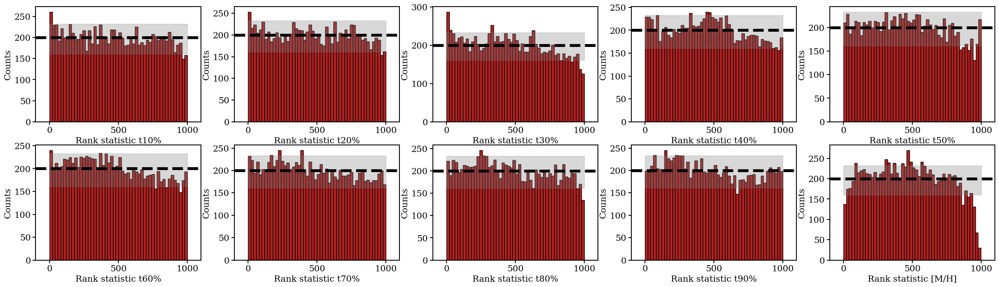

In [3]:

mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['xtick.labelsize'] = 'medium'
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.labelsize'] = 'medium'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['legend.frameon'] = True
mpl.rcParams['font.size'] = 15
mpl.rcParams["mathtext.fontset"]='dejavuserif'


lt=['t'+str(i*10)+'%' for i in range(1,11)] #label for percentiles
lt[-1]='[M/H]'

f, ax = sbc_rank_plot(
    ranks=ranks[:,:],
    num_posterior_samples=1000,
    parameter_labels=lt,
    plot_type="hist",
    num_bins=50,  # by passing None we use a heuristic for the number of bins.
    ranks_labels=None,
    figsize=(30,8),kwargs={'line_alpha':1,'num_cols':5})

plt.savefig('rank_statisitc_all_y.pdf')

Hand-made SBC rank plot

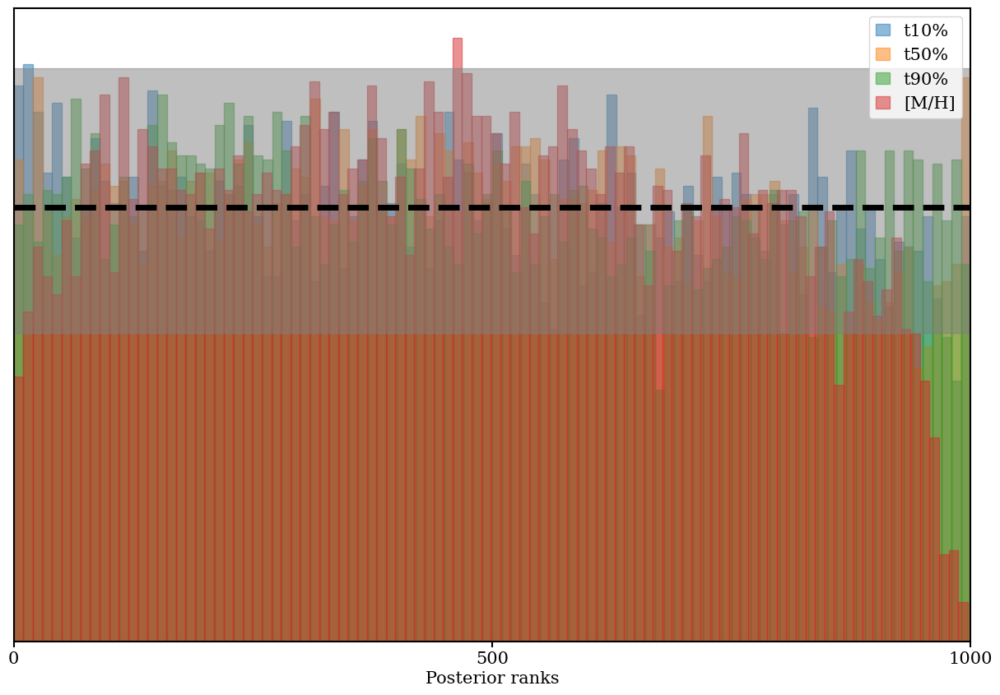

In [4]:
from scipy.stats import binom, gaussian_kde



num_bins=100
xlim_offset = int(num_posterior_samples * 0)

index_plot=[0,4,-2,-1]  #t10,t50,t90,met
for k,i in enumerate(index_plot):
    plt.hist(
    ranks[:,i],
    bins=num_bins,
    label=lt[i],
    color='C'+str(k),
    alpha=0.5,histtype='bar',edgecolor='C'+str(k))

plt.yticks([])

"""Plot region expected under uniformity."""

lower = binom(num_sbc_runs, p=1/(num_bins)).ppf(0.001)
upper = binom(num_sbc_runs, p=1/(num_bins)).ppf(0.999)

# Plot grey area with expected ECDF.
plt.fill_between(
x=np.linspace(0, num_posterior_samples, num_bins),
y1=np.repeat(lower, num_bins),
y2=np.repeat(upper, num_bins),
color='grey',
alpha=0.5,
)

#example with samples from uniform distribution
#plt.hist(np.random.randint(0,10000,size=10000)*0.1,bins=num_bins,color='grey',histtype='step')


#plt.axhline(binom(num_sbc_runs, p=1/(num_bins)).stats(moments='m'),ls='--',lw=10,c='k')
mean = binom(num_sbc_runs, p=1/(num_bins)).ppf(0.5)
plt.axhline(mean,ls='--',lw=5,c='k')

#plt.ylim(200,500)
plt.legend(loc=1, handlelength=0.8)
plt.xlim(-xlim_offset, num_posterior_samples + xlim_offset)
plt.xticks(np.linspace(0, num_posterior_samples, 3))
plt.xlabel("Posterior ranks")
plt.show()



    

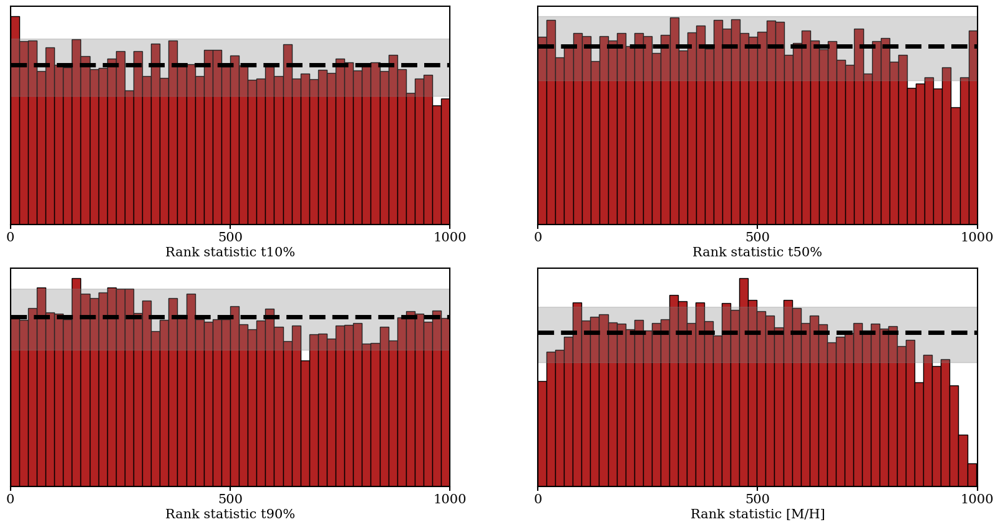

In [8]:
f, ax = sbc_rank_plot(
    ranks=ranks[:,index_plot],
    num_posterior_samples=1000,
    parameter_labels=np.array(lt)[index_plot],
    plot_type="hist",
    num_bins=50,  # by passing None we use a heuristic for the number of bins.
    ranks_labels=None,
    figsize=(20,10),kwargs={'line_alpha':1,'num_cols':2,'xlim_offset_factor':0})

plt.savefig('rank_statisitic.pdf')

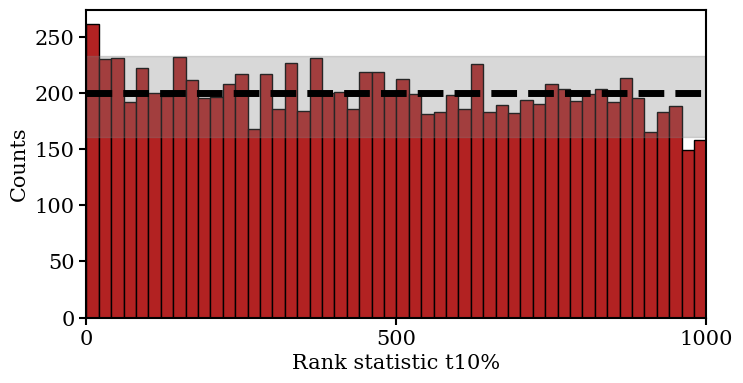

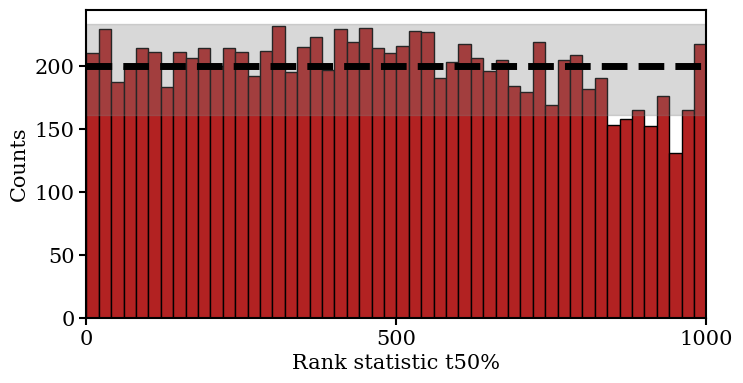

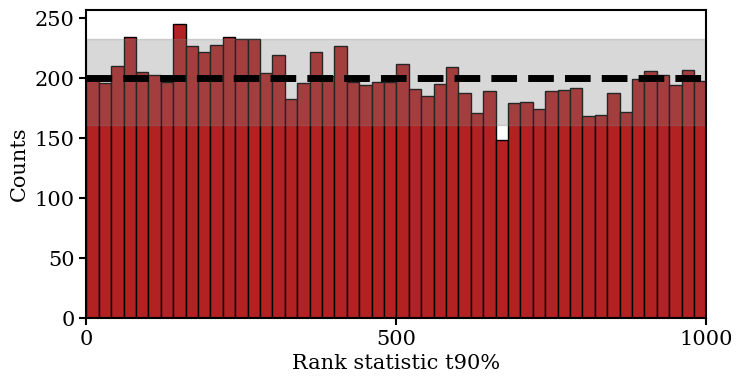

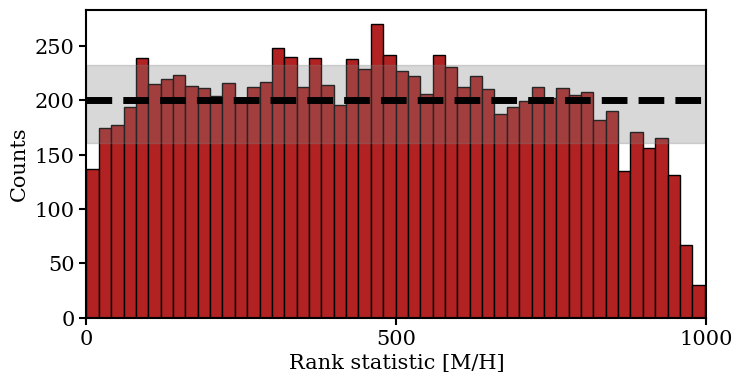

In [5]:
for i in index_plot:
    f, ax = sbc_rank_plot(
    ranks=np.reshape(ranks[:,i],(10000,1)),
    num_posterior_samples=1000,
    parameter_labels=np.reshape(np.array(lt)[i],(1,1))[0],
    plot_type="hist",
    num_bins=50,  # by passing None we use a heuristic for the number of bins.
    ranks_labels=None,
    figsize=(8,4),kwargs={'line_alpha':1,'num_cols':1,'xlim_offset_factor':0})
    plt.savefig('rank_statisitic'+str(i)+'.pdf',bbox_inches='tight')

[]

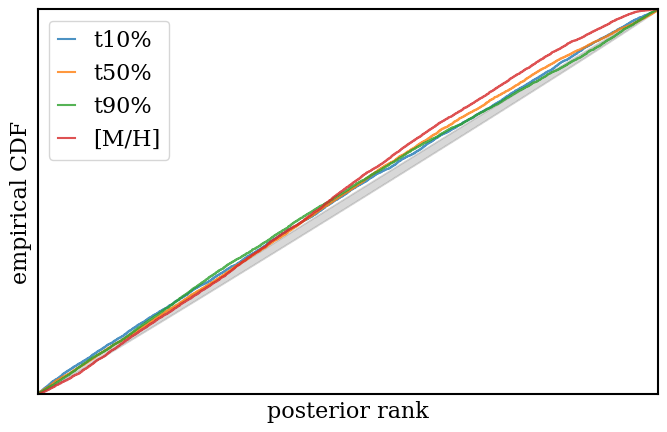

In [10]:
mpl.rcParams['font.size'] = 16
mpl.rcParams["figure.figsize"] = (15,15)


f, ax = sbc_rank_plot(ranks[:,index_plot] , 1_000, num_bins=500,plot_type="cdf", parameter_labels=np.array(lt)[index_plot])
ax.set_xticks([])
ax.set_yticks([])
#plt.savefig('ecdf.pdf')